1. Data: Import, clean and pre-process the data

In [255]:
# importing relevant libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport

In [256]:
# importing the dataset and saving it as dataframe

df = pd.read_csv('Part3 - vehicle.csv')

In [257]:
df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [258]:
df.shape

# the dataset contains 846 rows and 19 column; high dimensions

(846, 19)

In [259]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [260]:
df.isnull().sum()

# we notice that there are many null values in the dataset
# we will analyse each column and accordingly impute

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [261]:
df.describe().T

# skewness about and skewness about 1 has 0 minimum value and due to lack of domain knowledge we are not sure if this is acceptable or invalid
# we will assume skewness about and skewness about 1 can be 0

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


In [262]:
df.duplicated().sum()

# there are no duplicate data

0

In [263]:
profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)
profile.to_file("part1_eda.html")

# generating report for eda

2. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden

In [264]:
# defining a function to automate univariate numerical analysis

def univariateAnalysis_numeric(column,nbins):
    print("Description of " + column)
    print("----------------------------------------------------------------------------")
    print(df[column].describe(),end=' ')
    
    
    plt.figure()
    print("Distribution of " + column)
    print("----------------------------------------------------------------------------")
    sns.displot(df[column], kind='hist', color='g');
    plt.show()

    plt.figure()
    print("KDE of " + column)
    print("----------------------------------------------------------------------------")
    sns.kdeplot(df[column], color='g', fill=True);
    plt.show()
    
    plt.figure()
    print("BoxPlot of " + column)
    print("----------------------------------------------------------------------------")
    ax = sns.boxplot(x=df[column], color='g')
    plt.show()
    
    print("============================================================================")


In [265]:
# creating a function to automate outlier treatment

def treat_outlier(x):
    # taking 5,25,75 percentile of column
    q5= np.percentile(x,5)
    q25=np.percentile(x,25)
    q75=np.percentile(x,75)
    dt=np.percentile(x,95)
    #calculationg IQR range
    IQR=q75-q25
    #Calculating minimum threshold
    lower_bound=q25-(1.5*IQR)
    upper_bound=q75+(1.5*IQR)
    #Capping outliers
    return x.apply(lambda y: dt if y > upper_bound else y).apply(lambda y: q5 if y < lower_bound else y)

Description of compactness
----------------------------------------------------------------------------
count    846.000000
mean      93.678487
std        8.234474
min       73.000000
25%       87.000000
50%       93.000000
75%      100.000000
max      119.000000
Name: compactness, dtype: float64 Distribution of compactness
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

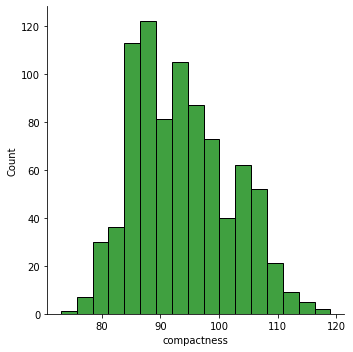

KDE of compactness
----------------------------------------------------------------------------


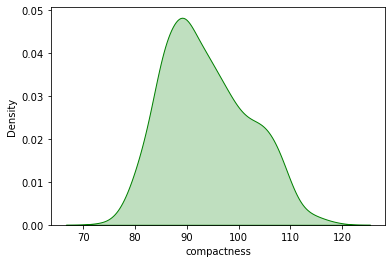

BoxPlot of compactness
----------------------------------------------------------------------------


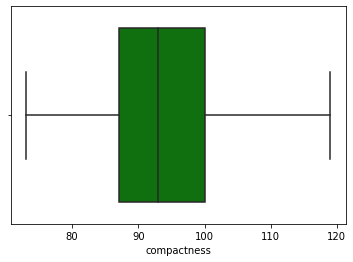

In [266]:
univariateAnalysis_numeric("compactness",20)

# mean and median are almost at the same point
# the distribution is slightly skewed without outliers

Description of circularity
----------------------------------------------------------------------------
count    841.000000
mean      44.828775
std        6.152172
min       33.000000
25%       40.000000
50%       44.000000
75%       49.000000
max       59.000000
Name: circularity, dtype: float64 Distribution of circularity
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

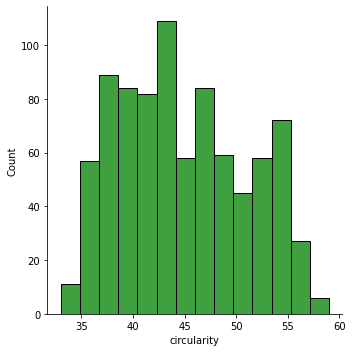

KDE of circularity
----------------------------------------------------------------------------


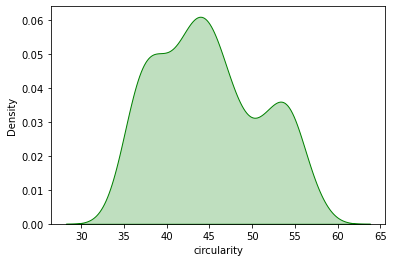

BoxPlot of circularity
----------------------------------------------------------------------------


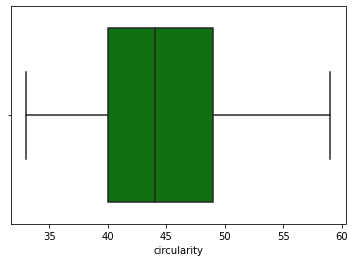

In [267]:
univariateAnalysis_numeric("circularity",20)

# mean and median are almost at the same point
# there are null values in this column and we will replace them with mean values
# the distribution has two possible peaks but without any outliers

In [268]:
# imputing missing values with mean

df["circularity"].fillna(df["circularity"].mean(), inplace=True)
df["circularity"].isnull().sum()

0

Description of distance_circularity
----------------------------------------------------------------------------
count    842.000000
mean      82.110451
std       15.778292
min       40.000000
25%       70.000000
50%       80.000000
75%       98.000000
max      112.000000
Name: distance_circularity, dtype: float64 Distribution of distance_circularity
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

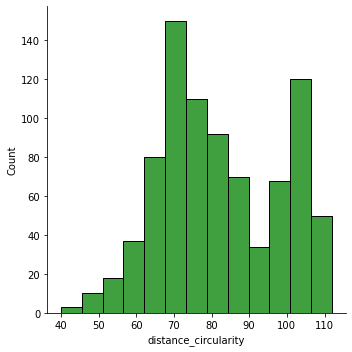

KDE of distance_circularity
----------------------------------------------------------------------------


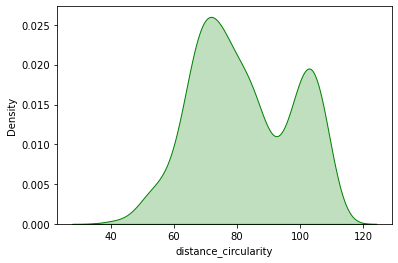

BoxPlot of distance_circularity
----------------------------------------------------------------------------


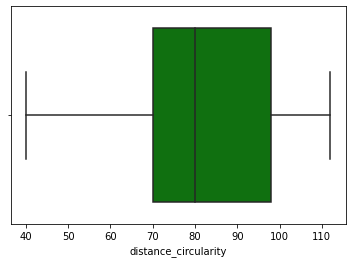

In [269]:
univariateAnalysis_numeric("distance_circularity",20)

# mean and median are slightly apart, and there are two peaks in the distribution.
# there are null values in the column but we will dropthem

In [270]:
# dropping the null values

df.drop(df[df["distance_circularity"].isnull()].index, inplace=True)

Description of radius_ratio
----------------------------------------------------------------------------
count    836.000000
mean     168.960526
std       33.518137
min      104.000000
25%      141.000000
50%      167.000000
75%      195.000000
max      333.000000
Name: radius_ratio, dtype: float64 Distribution of radius_ratio
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

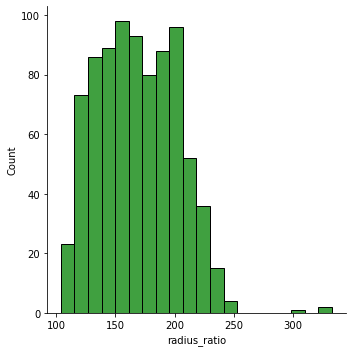

KDE of radius_ratio
----------------------------------------------------------------------------


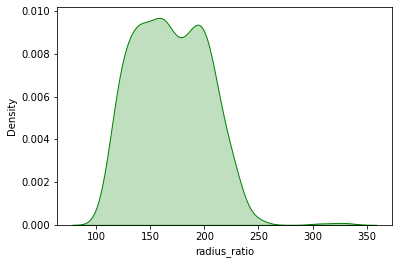

BoxPlot of radius_ratio
----------------------------------------------------------------------------


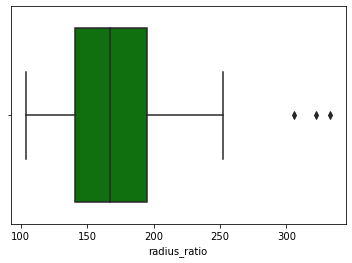

In [271]:
univariateAnalysis_numeric("radius_ratio", 20)

# mean and mediam are close and the distribution has two peaks
# there are outliers, which will be trated and all null values will be imputed by mean, as mean and median are quite close

In [272]:
# imputing null wiht mean values

df["radius_ratio"].fillna(df["radius_ratio"].mean(), inplace=True)
df["radius_ratio"].isnull().sum()

0

Description of radius_ratio
----------------------------------------------------------------------------
count    842.000000
mean     168.610170
std       32.298402
min      104.000000
25%      141.000000
50%      168.000000
75%      195.000000
max      252.000000
Name: radius_ratio, dtype: float64 Distribution of radius_ratio
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

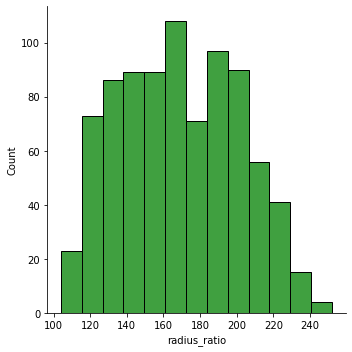

KDE of radius_ratio
----------------------------------------------------------------------------


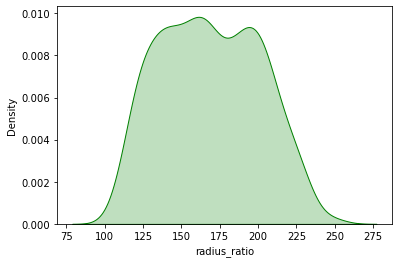

BoxPlot of radius_ratio
----------------------------------------------------------------------------


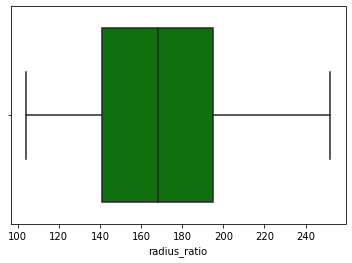

In [273]:
#  outlier treatment
df["radius_ratio"] = treat_outlier(df["radius_ratio"])
univariateAnalysis_numeric("radius_ratio", 20)

Description of pr.axis_aspect_ratio
----------------------------------------------------------------------------
count    840.000000
mean      61.689286
std        7.902105
min       47.000000
25%       57.000000
50%       61.000000
75%       65.000000
max      138.000000
Name: pr.axis_aspect_ratio, dtype: float64 Distribution of pr.axis_aspect_ratio
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

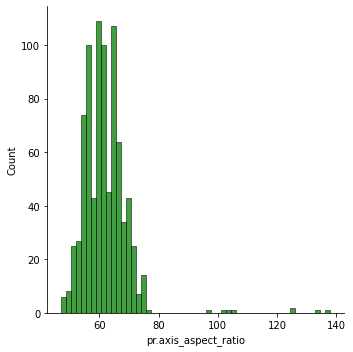

KDE of pr.axis_aspect_ratio
----------------------------------------------------------------------------


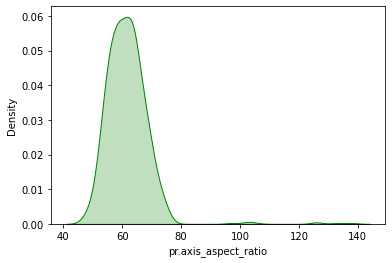

BoxPlot of pr.axis_aspect_ratio
----------------------------------------------------------------------------


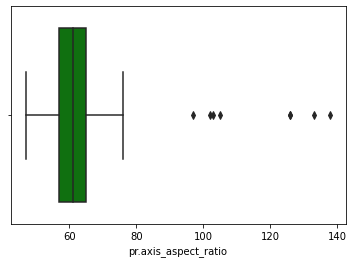

In [274]:
univariateAnalysis_numeric("pr.axis_aspect_ratio", 20)

# mean and median are very close and there are few outliers that is stretching the scale on the xaxis
# we will treat the outliers
# we will replace the null values with the median value

In [275]:
# imputing null values with mediam valies
df["pr.axis_aspect_ratio"].fillna(df["pr.axis_aspect_ratio"].median(), inplace=True)
df["pr.axis_aspect_ratio"].isnull().sum()

0

Description of pr.axis_aspect_ratio
----------------------------------------------------------------------------
count    842.000000
mean      61.257720
std        5.696764
min       47.000000
25%       57.000000
50%       61.000000
75%       65.000000
max       76.000000
Name: pr.axis_aspect_ratio, dtype: float64 Distribution of pr.axis_aspect_ratio
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

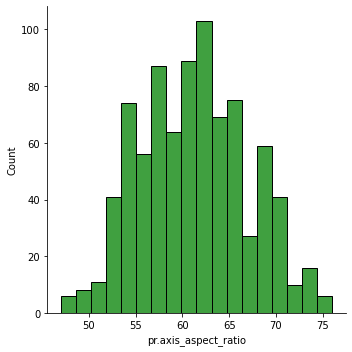

KDE of pr.axis_aspect_ratio
----------------------------------------------------------------------------


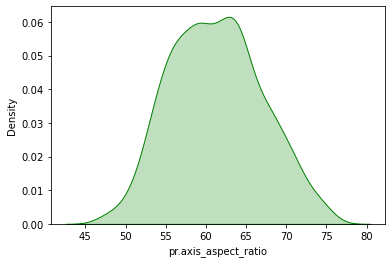

BoxPlot of pr.axis_aspect_ratio
----------------------------------------------------------------------------


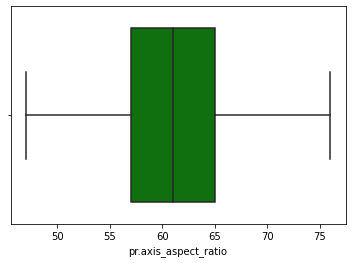

In [276]:
# treating outliers
# the distribution is close to normal now
df["pr.axis_aspect_ratio"] = treat_outlier(df["pr.axis_aspect_ratio"])
univariateAnalysis_numeric("pr.axis_aspect_ratio", 20)

Description of max.length_aspect_ratio
----------------------------------------------------------------------------
count    842.000000
mean       8.572447
std        4.610911
min        2.000000
25%        7.000000
50%        8.000000
75%       10.000000
max       55.000000
Name: max.length_aspect_ratio, dtype: float64 Distribution of max.length_aspect_ratio
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

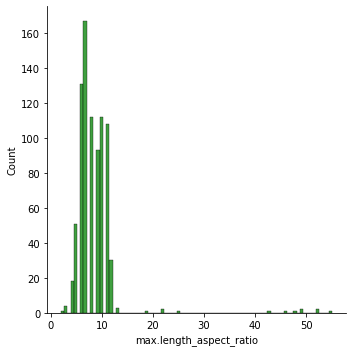

KDE of max.length_aspect_ratio
----------------------------------------------------------------------------


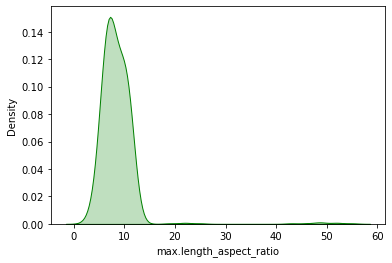

BoxPlot of max.length_aspect_ratio
----------------------------------------------------------------------------


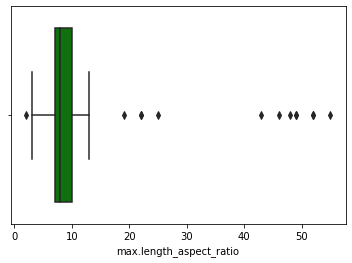

In [277]:
univariateAnalysis_numeric("max.length_aspect_ratio", 20)

# mean and median are very close and there are few outliers that is stretching the scale on the xaxis
# we will treat the outliers

Description of max.length_aspect_ratio
----------------------------------------------------------------------------
count    842.000000
mean       8.174584
std        2.120433
min        3.000000
25%        7.000000
50%        8.000000
75%       10.000000
max       13.000000
Name: max.length_aspect_ratio, dtype: float64 Distribution of max.length_aspect_ratio
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

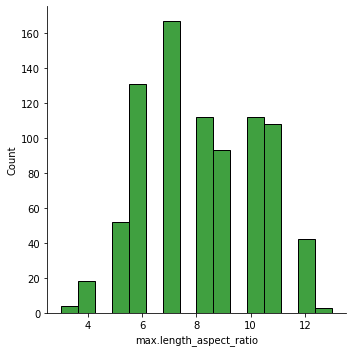

KDE of max.length_aspect_ratio
----------------------------------------------------------------------------


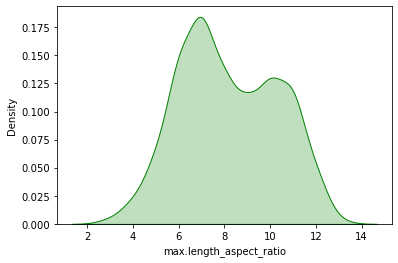

BoxPlot of max.length_aspect_ratio
----------------------------------------------------------------------------


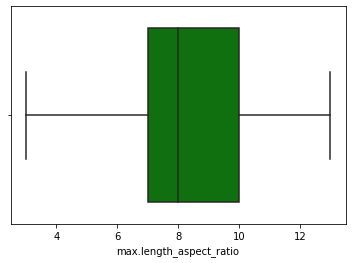

In [278]:
# outlier treatment

df["max.length_aspect_ratio"] = treat_outlier(df["max.length_aspect_ratio"])
univariateAnalysis_numeric("max.length_aspect_ratio", 20)

Description of scatter_ratio
----------------------------------------------------------------------------
count    841.000000
mean     168.901308
std       33.231096
min      112.000000
25%      146.000000
50%      157.000000
75%      198.000000
max      265.000000
Name: scatter_ratio, dtype: float64 Distribution of scatter_ratio
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

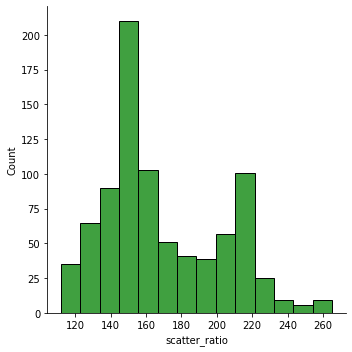

KDE of scatter_ratio
----------------------------------------------------------------------------


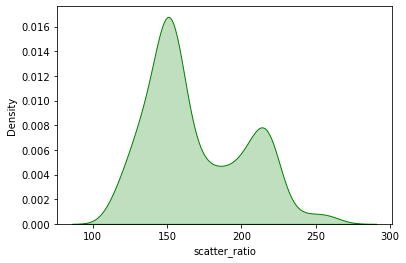

BoxPlot of scatter_ratio
----------------------------------------------------------------------------


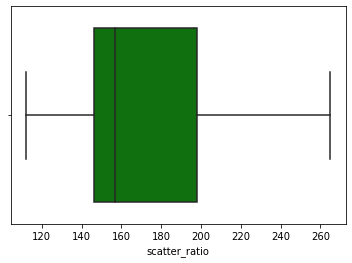

In [279]:
univariateAnalysis_numeric("scatter_ratio", 20)

# mean and median are far from eachother, and the distribution has two peaks
# no outliers

In [280]:
# imputing null values with mediam values
df["scatter_ratio"].fillna(df["scatter_ratio"].median(), inplace=True)
df["scatter_ratio"].isnull().sum()

0

Description of elongatedness
----------------------------------------------------------------------------
count    841.000000
mean      40.932224
std        7.821455
min       26.000000
25%       33.000000
50%       43.000000
75%       46.000000
max       61.000000
Name: elongatedness, dtype: float64 Distribution of elongatedness
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

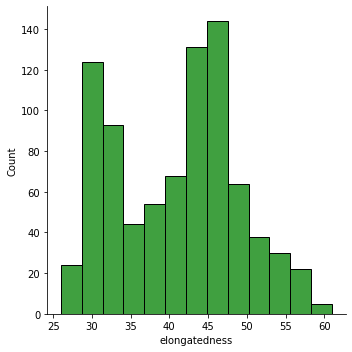

KDE of elongatedness
----------------------------------------------------------------------------


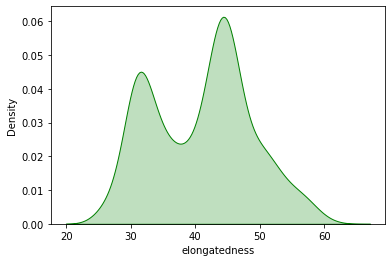

BoxPlot of elongatedness
----------------------------------------------------------------------------


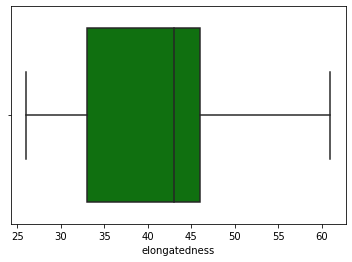

In [281]:
univariateAnalysis_numeric("elongatedness", 20)

# mean and median are not at the same point
# there are two peaks in the distribution and no outliers

In [282]:
# dropping the null values

df.drop(df[df["elongatedness"].isnull()].index, inplace=True)

Description of pr.axis_rectangularity
----------------------------------------------------------------------------
count    838.000000
mean      20.582339
std        2.594871
min       17.000000
25%       19.000000
50%       20.000000
75%       23.000000
max       29.000000
Name: pr.axis_rectangularity, dtype: float64 Distribution of pr.axis_rectangularity
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

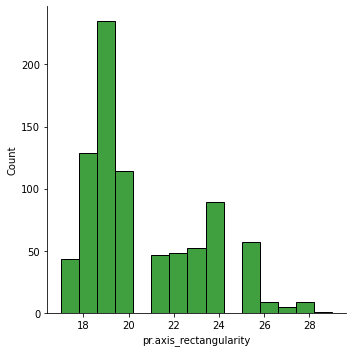

KDE of pr.axis_rectangularity
----------------------------------------------------------------------------


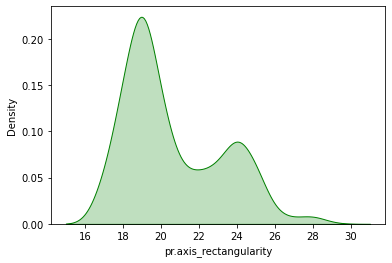

BoxPlot of pr.axis_rectangularity
----------------------------------------------------------------------------


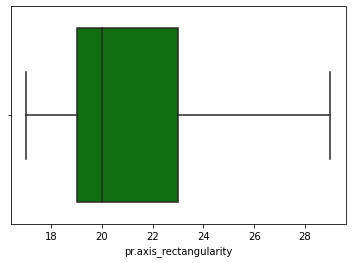

In [283]:
univariateAnalysis_numeric("pr.axis_rectangularity", 20)

# mean and median are almost at the same point
# there are no outliers and there ar two peaks in the distribution

In [284]:
# imputing null values with mean 

df["pr.axis_rectangularity"].fillna(df["pr.axis_rectangularity"].mean(), inplace=True)
df["pr.axis_rectangularity"].isnull().sum()

0

Description of max.length_rectangularity
----------------------------------------------------------------------------
count    841.000000
mean     148.007134
std       14.537962
min      118.000000
25%      137.000000
50%      146.000000
75%      159.000000
max      188.000000
Name: max.length_rectangularity, dtype: float64 Distribution of max.length_rectangularity
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

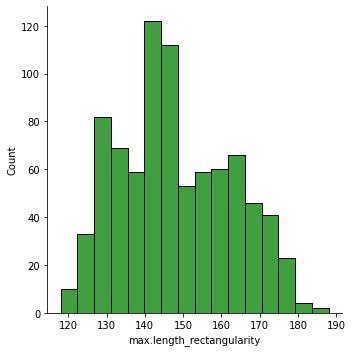

KDE of max.length_rectangularity
----------------------------------------------------------------------------


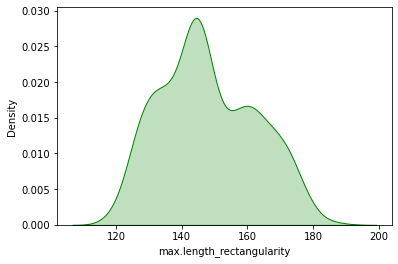

BoxPlot of max.length_rectangularity
----------------------------------------------------------------------------


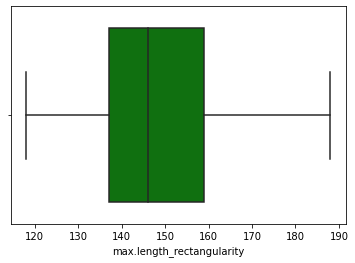

In [285]:
univariateAnalysis_numeric("max.length_rectangularity", 20)

# the mean and median are not at the same point but are not too far
# no outliers
# has three possible peaks in distribution

Description of scaled_variance
----------------------------------------------------------------------------
count    838.000000
mean     188.627685
std       31.415888
min      130.000000
25%      167.000000
50%      179.000000
75%      217.000000
max      320.000000
Name: scaled_variance, dtype: float64 Distribution of scaled_variance
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

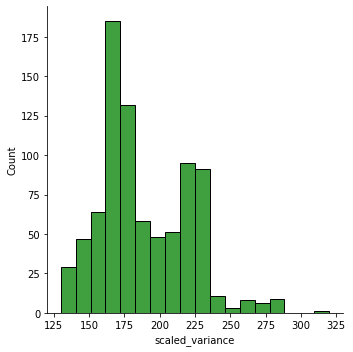

KDE of scaled_variance
----------------------------------------------------------------------------


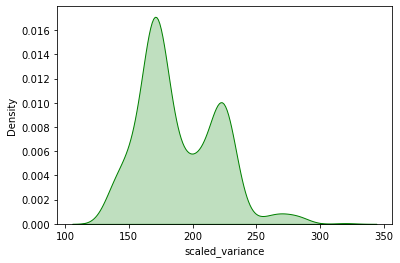

BoxPlot of scaled_variance
----------------------------------------------------------------------------


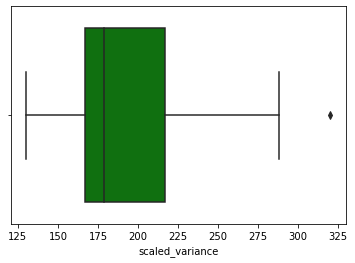

In [286]:
univariateAnalysis_numeric("scaled_variance", 20)

# mean and median are not at the same point or close enough
# few outliers are present and presence of multiple peaks in the distribution

In [287]:
# imputing null with mean value

df["scaled_variance"].fillna(df["scaled_variance"].mean(), inplace=True)
df["scaled_variance"].isnull().sum()

0

Description of scaled_variance
----------------------------------------------------------------------------
count    841.000000
mean     188.525426
std       31.069718
min      130.000000
25%      167.000000
50%      179.000000
75%      217.000000
max      288.000000
Name: scaled_variance, dtype: float64 Distribution of scaled_variance
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

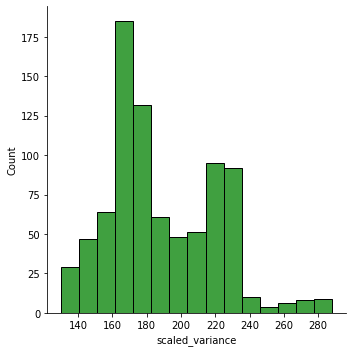

KDE of scaled_variance
----------------------------------------------------------------------------


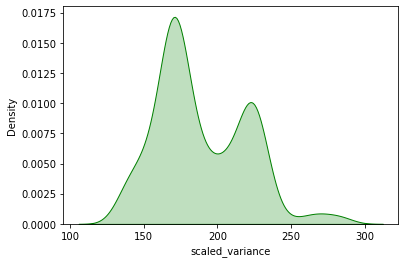

BoxPlot of scaled_variance
----------------------------------------------------------------------------


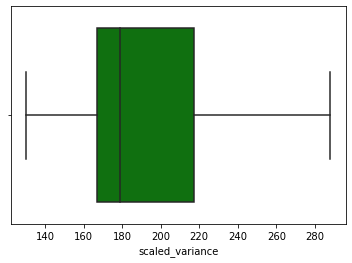

In [288]:
# treating outliers
df["scaled_variance"] = treat_outlier(df["scaled_variance"])
univariateAnalysis_numeric("scaled_variance", 20)

Description of scaled_variance.1
----------------------------------------------------------------------------
count     839.000000
mean      439.575685
std       176.787303
min       184.000000
25%       318.000000
50%       364.000000
75%       587.000000
max      1018.000000
Name: scaled_variance.1, dtype: float64 Distribution of scaled_variance.1
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

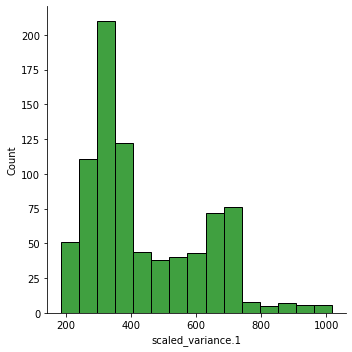

KDE of scaled_variance.1
----------------------------------------------------------------------------


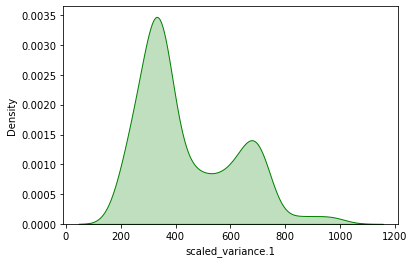

BoxPlot of scaled_variance.1
----------------------------------------------------------------------------


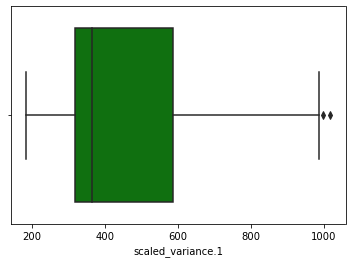

In [289]:
univariateAnalysis_numeric("scaled_variance.1", 20)

#  mean and median are far off
# presence of multiple peaks and few outliers

In [290]:
# dropping null values
df.drop(df[df["scaled_variance.1"].isnull()].index, inplace=True)

Description of scaled_variance.1
----------------------------------------------------------------------------
count    839.000000
mean     438.908224
std      175.158414
min      184.000000
25%      318.000000
50%      364.000000
75%      587.000000
max      987.000000
Name: scaled_variance.1, dtype: float64 Distribution of scaled_variance.1
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

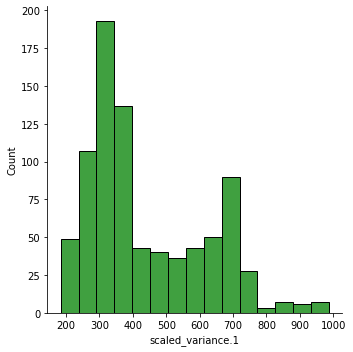

KDE of scaled_variance.1
----------------------------------------------------------------------------


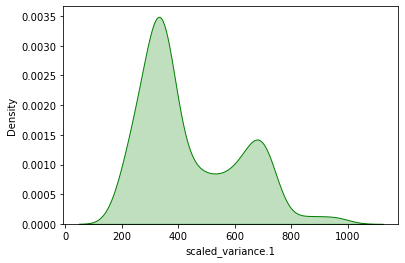

BoxPlot of scaled_variance.1
----------------------------------------------------------------------------


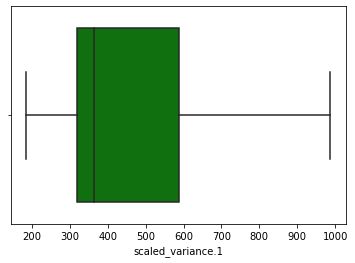

In [291]:
# outlier treatment

df["scaled_variance.1"] = treat_outlier(df["scaled_variance.1"])
univariateAnalysis_numeric("scaled_variance.1", 20)

Description of scaled_radius_of_gyration
----------------------------------------------------------------------------
count    838.000000
mean     174.621718
std       32.628335
min      109.000000
25%      149.000000
50%      173.000000
75%      198.000000
max      268.000000
Name: scaled_radius_of_gyration, dtype: float64 Distribution of scaled_radius_of_gyration
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

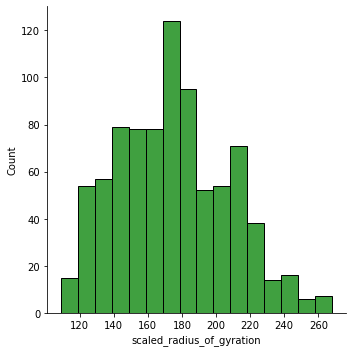

KDE of scaled_radius_of_gyration
----------------------------------------------------------------------------


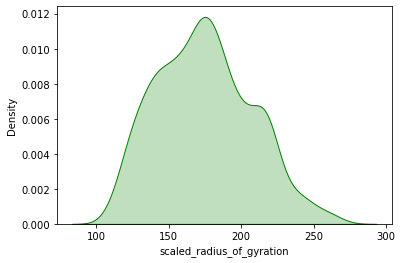

BoxPlot of scaled_radius_of_gyration
----------------------------------------------------------------------------


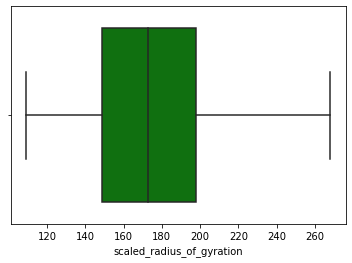

In [292]:
univariateAnalysis_numeric("scaled_radius_of_gyration", 20)

# mean and median are relatively closer but at the same point
# there are no outliers but presence of three possible peaks in distribution but is close to normal distributon

In [293]:
# imputing null values with mean

df["scaled_radius_of_gyration"].fillna(df["scaled_radius_of_gyration"].mean(), inplace=True)
df["scaled_radius_of_gyration"].isnull().sum()

0

Description of scaled_radius_of_gyration.1
----------------------------------------------------------------------------
count    835.000000
mean      72.432335
std        7.483229
min       59.000000
25%       67.000000
50%       71.000000
75%       75.000000
max      135.000000
Name: scaled_radius_of_gyration.1, dtype: float64 Distribution of scaled_radius_of_gyration.1
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

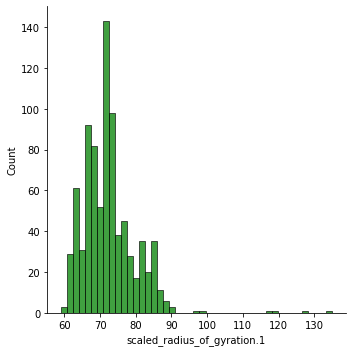

KDE of scaled_radius_of_gyration.1
----------------------------------------------------------------------------


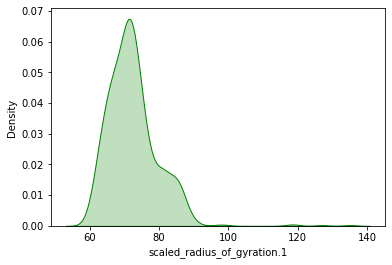

BoxPlot of scaled_radius_of_gyration.1
----------------------------------------------------------------------------


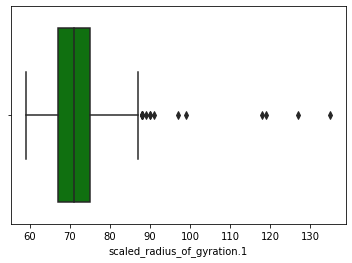

In [294]:
univariateAnalysis_numeric("scaled_radius_of_gyration.1", 20)

# there are outliers present in the data
# mean and median are not too far away

In [295]:
# imputing null wiht mean values

df["scaled_radius_of_gyration.1"].fillna(df["scaled_radius_of_gyration.1"].mean(), inplace=True)
df["scaled_radius_of_gyration.1"].isnull().sum()

0

Description of scaled_radius_of_gyration.1
----------------------------------------------------------------------------
count    839.000000
mean      72.170118
std        6.380858
min       59.000000
25%       67.000000
50%       72.000000
75%       75.000000
max       87.000000
Name: scaled_radius_of_gyration.1, dtype: float64 Distribution of scaled_radius_of_gyration.1
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

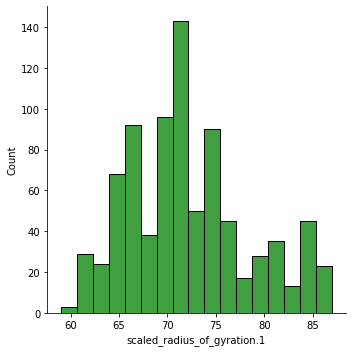

KDE of scaled_radius_of_gyration.1
----------------------------------------------------------------------------


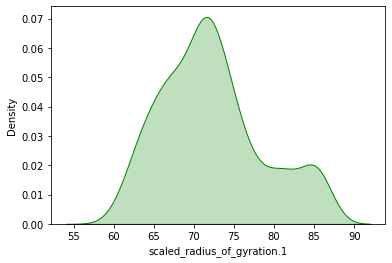

BoxPlot of scaled_radius_of_gyration.1
----------------------------------------------------------------------------


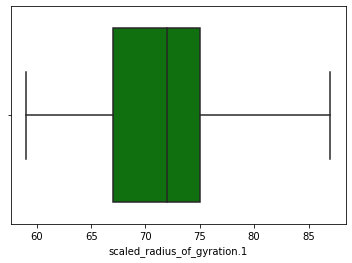

In [296]:
# treating outliers

df["scaled_radius_of_gyration.1"] = treat_outlier(df["scaled_radius_of_gyration.1"])
univariateAnalysis_numeric("scaled_radius_of_gyration.1", 20)

Description of skewness_about
----------------------------------------------------------------------------
count    833.000000
mean       6.356543
std        4.910143
min        0.000000
25%        2.000000
50%        6.000000
75%        9.000000
max       22.000000
Name: skewness_about, dtype: float64 Distribution of skewness_about
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

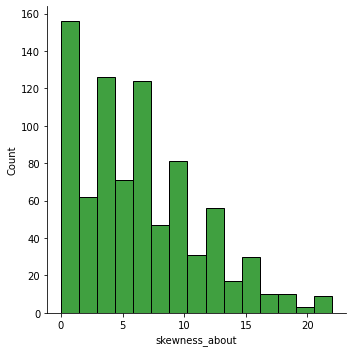

KDE of skewness_about
----------------------------------------------------------------------------


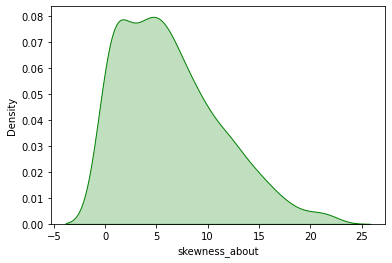

BoxPlot of skewness_about
----------------------------------------------------------------------------


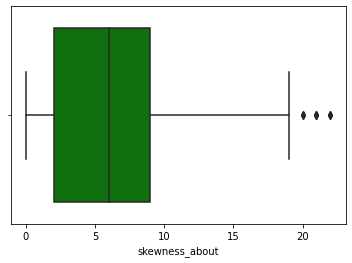

In [297]:
univariateAnalysis_numeric("skewness_about", 20)

# presence of multiple peaks and few outliers
# mean and mediam are not too far away

In [298]:
# imputing null with mean values

df["skewness_about"].fillna(df["skewness_about"].mean(), inplace=True)
df["skewness_about"].isnull().sum()

0

Description of skewness_about
----------------------------------------------------------------------------
count    839.000000
mean       6.283837
std        4.706311
min        0.000000
25%        2.000000
50%        6.000000
75%        9.000000
max       19.000000
Name: skewness_about, dtype: float64 Distribution of skewness_about
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

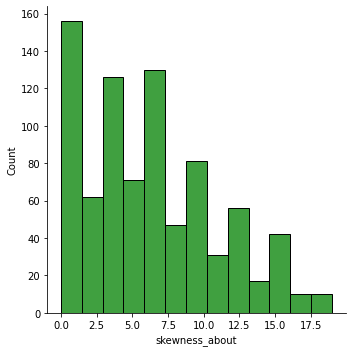

KDE of skewness_about
----------------------------------------------------------------------------


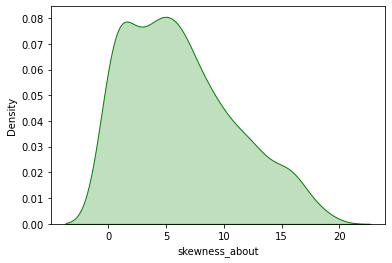

BoxPlot of skewness_about
----------------------------------------------------------------------------


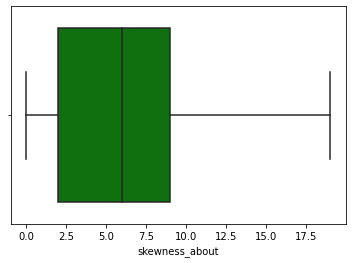

In [299]:
# treating outliers

df["skewness_about"] = treat_outlier(df["skewness_about"])
univariateAnalysis_numeric("skewness_about", 20)

Description of skewness_about.1
----------------------------------------------------------------------------
count    838.000000
mean      12.602625
std        8.936165
min        0.000000
25%        5.000000
50%       11.000000
75%       19.000000
max       41.000000
Name: skewness_about.1, dtype: float64 Distribution of skewness_about.1
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

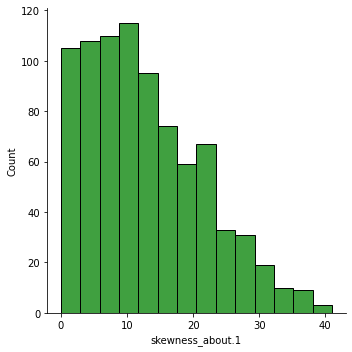

KDE of skewness_about.1
----------------------------------------------------------------------------


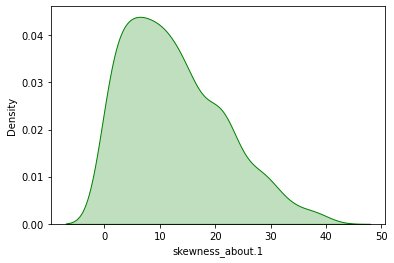

BoxPlot of skewness_about.1
----------------------------------------------------------------------------


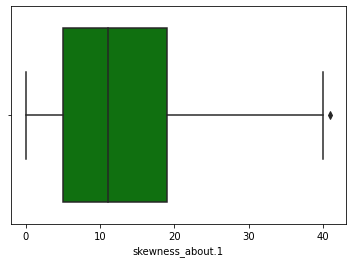

In [300]:
univariateAnalysis_numeric("skewness_about.1", 20)

# presence of multiple peaks and few outliers
# mean and mediam are close enough

In [301]:
# imputing null values with median
df["skewness_about.1"].fillna(df["skewness_about.1"].median(), inplace=True)
df["skewness_about.1"].isnull().sum()

0

Description of skewness_about.1
----------------------------------------------------------------------------
count    839.000000
mean      12.586412
std        8.895004
min        0.000000
25%        5.000000
50%       11.000000
75%       19.000000
max       40.000000
Name: skewness_about.1, dtype: float64 Distribution of skewness_about.1
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

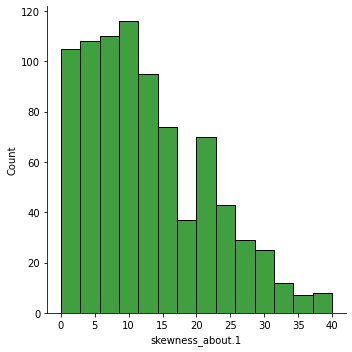

KDE of skewness_about.1
----------------------------------------------------------------------------


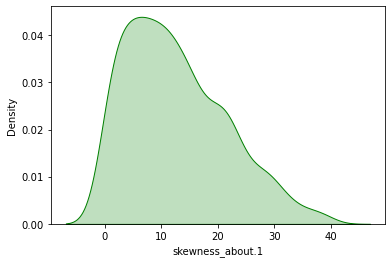

BoxPlot of skewness_about.1
----------------------------------------------------------------------------


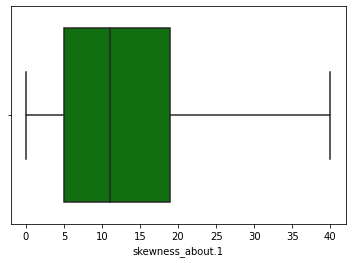

In [302]:

# treating outliers

df["skewness_about.1"] = treat_outlier(df["skewness_about.1"])
univariateAnalysis_numeric("skewness_about.1", 20)

Description of skewness_about.2
----------------------------------------------------------------------------
count    838.000000
mean     188.935561
std        6.156901
min      176.000000
25%      184.000000
50%      188.000000
75%      193.000000
max      206.000000
Name: skewness_about.2, dtype: float64 Distribution of skewness_about.2
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

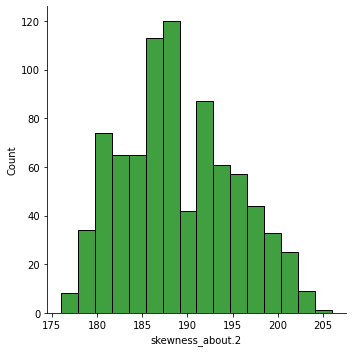

KDE of skewness_about.2
----------------------------------------------------------------------------


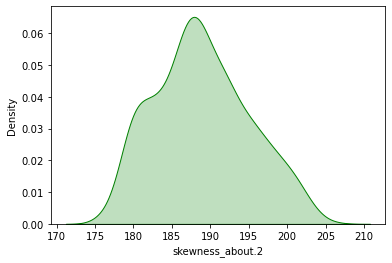

BoxPlot of skewness_about.2
----------------------------------------------------------------------------


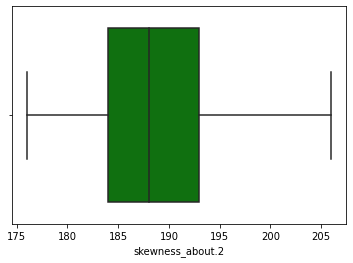

In [303]:
univariateAnalysis_numeric("skewness_about.2", 20)

# presence of multiple peaks and no outliers
# mean and mediam closer

In [304]:
# imputing null values with mean

df["skewness_about.2"].fillna(df["skewness_about.2"].mean(), inplace=True)
df["skewness_about.2"].isnull().sum()

0

Description of hollows_ratio
----------------------------------------------------------------------------
count    839.00000
mean     195.66031
std        7.42779
min      181.00000
25%      191.00000
50%      197.00000
75%      201.00000
max      211.00000
Name: hollows_ratio, dtype: float64 Distribution of hollows_ratio
----------------------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

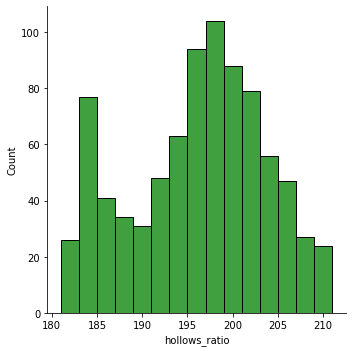

KDE of hollows_ratio
----------------------------------------------------------------------------


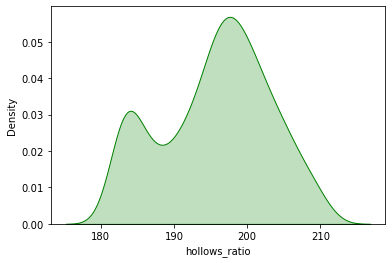

BoxPlot of hollows_ratio
----------------------------------------------------------------------------


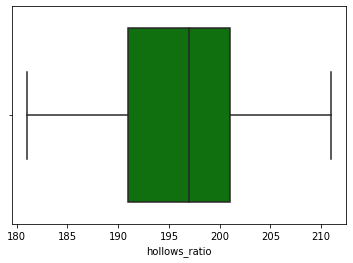

In [305]:
univariateAnalysis_numeric("hollows_ratio", 20)

# presence of multiple peaks and no outliers
# mean and mediam are not close

In [306]:
# imputing null values with mean

df["hollows_ratio"].fillna(df["hollows_ratio"].mean(), inplace=True)
df["hollows_ratio"].isnull().sum()

0

In [307]:
df.info()

# we started with 846 rows and now we have 839 rows
# all columns have the right datatype

<class 'pandas.core.frame.DataFrame'>
Int64Index: 839 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  839 non-null    int64  
 1   circularity                  839 non-null    float64
 2   distance_circularity         839 non-null    float64
 3   radius_ratio                 839 non-null    float64
 4   pr.axis_aspect_ratio         839 non-null    float64
 5   max.length_aspect_ratio      839 non-null    float64
 6   scatter_ratio                839 non-null    float64
 7   elongatedness                839 non-null    float64
 8   pr.axis_rectangularity       839 non-null    float64
 9   max.length_rectangularity    839 non-null    int64  
 10  scaled_variance              839 non-null    float64
 11  scaled_variance.1            839 non-null    float64
 12  scaled_radius_of_gyration    839 non-null    float64
 13  scaled_radius_of_gyr

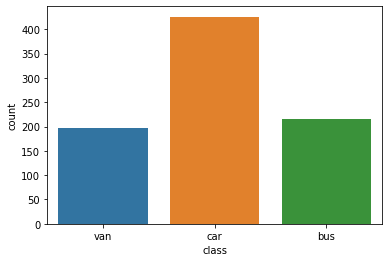

In [308]:
sns.countplot(data=df, x=df["class"]);

# exploring the target and appears car is slightly higher than th other two class types

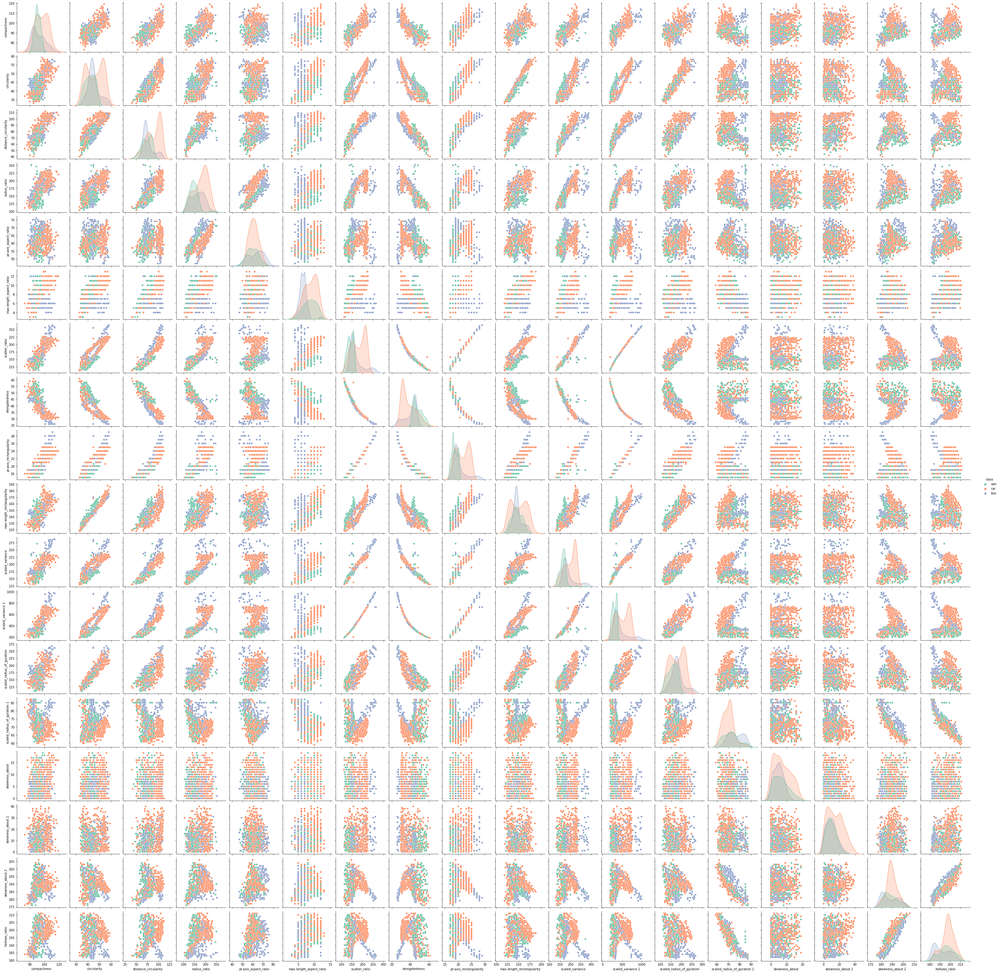

In [309]:
sns.pairplot(df,hue="class", palette="Set2");

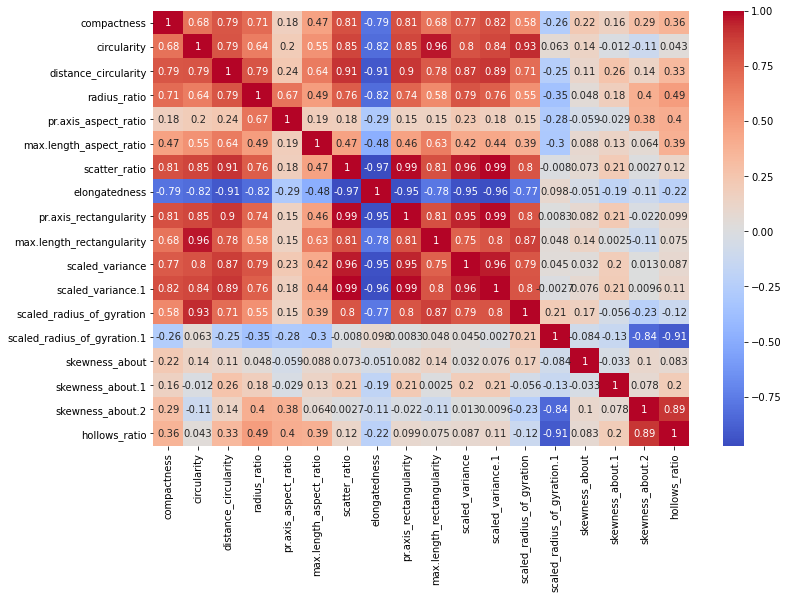

In [310]:
plt.figure(figsize=(12,8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm');

# as seen from the pariplot and the heatmap, there are some good amount of corelation in the dataset among features
# car in the target class is dominant

In [311]:
# as we have imputed the dataset, we will reset the index

df.reset_index(inplace = True)

3. Classifier: Design and train a best fit SVM classier using all the data attributes.

In [312]:
# splitting X, y for SVM

X = df.drop('class',axis=1)
y = df['class']

In [313]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [314]:
# train test split, we will keep 30% of data for test

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [315]:
from sklearn.preprocessing import StandardScaler

In [316]:
scaler = StandardScaler()

In [317]:
# scaling the data usng standard scalar

scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)

In [318]:
from sklearn.svm import SVC

In [319]:
# we will create a instance of svc with class weight balanced, and use grid search to find the best parameters

svc = SVC(class_weight='balanced')

In [320]:
from sklearn.model_selection import GridSearchCV

In [321]:
# creating different paramters for grid search

param_grid = {'C':[0.001,0.01,0.1,0.5,1],'gamma':['scale','auto']}
grid = GridSearchCV(svc,param_grid)

In [322]:
grid.fit(scaled_X_train,y_train)

GridSearchCV(estimator=SVC(class_weight='balanced'),
             param_grid={'C': [0.001, 0.01, 0.1, 0.5, 1],
                         'gamma': ['scale', 'auto']})

In [323]:
print(f"The best parameters found by grid search are: {grid.best_params_}")

The best parameters found by grid search are: {'C': 1, 'gamma': 'scale'}


In [324]:
grid_pred = grid.predict(scaled_X_test)

In [325]:
# we will not generate the confusion matrix and classification report, that will allow us to view the performance of the model

from sklearn.metrics import confusion_matrix,classification_report

In [326]:
confusion_matrix(y_test,grid_pred)

array([[ 67,   1,   1],
       [  3, 108,   9],
       [  0,   0,  63]])

In [327]:
print(classification_report(y_test,grid_pred))

# the accuracy score is 94% 

              precision    recall  f1-score   support

         bus       0.96      0.97      0.96        69
         car       0.99      0.90      0.94       120
         van       0.86      1.00      0.93        63

    accuracy                           0.94       252
   macro avg       0.94      0.96      0.94       252
weighted avg       0.95      0.94      0.94       252



4. Dimensional reduction: perform dimensional reduction on the data.

In [328]:
# we will use PCA to reduce dimensions and then see the impact on the accuracy score
# scaling the features set, X for PCA

scaled_X = scaler.fit_transform(X)

In [329]:
from sklearn.decomposition import PCA

In [330]:
# we will use a for loop to view the variance explaince by various PCA components

var_expl = []

for i in range(2,10):
    pca_model = PCA(n_components=i)
    pca_X = pca_model.fit_transform(scaled_X)
    var_expl.append(np.sum(pca_model.explained_variance_ratio_))

In [331]:
var_expl

[0.6876542598062813,
 0.7503151108202692,
 0.8119822640231188,
 0.8636899712921117,
 0.9097899251575547,
 0.9469243512375712,
 0.9642579704796648,
 0.9758643275776128]

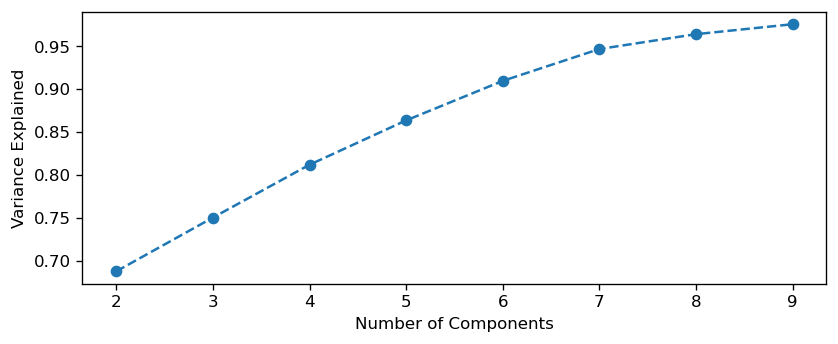

In [332]:
plt.figure(figsize=(8,3),dpi=120)
plt.plot(range(2,10),var_expl,'o--')
plt.xlabel("Number of Components")
plt.ylabel("Variance Explained");

# as we cn see from the chart, 6 PCA components explains more than 90% of the variance. This will allow us to reduce dimensions from 19 to 6

5. Classifier: Design and train a best fit SVM classier using dimensionally reduced attributes.

In [333]:
# we will use the pca components (n = 6), use it in SVM, and then check the accuracy score
# we will fit and transform the pca model with 6 components

pca_model = PCA(n_components=6)

In [334]:
pca_X = pca_model.fit_transform(scaled_X)

In [335]:
pca_df = pd.DataFrame(pca_X)

In [336]:
# adding the target class to the pca df

pca_df["class"] = y

In [337]:
pca_df.head(3)

,0,1,2,3,4,5,class
0,0.531081,-0.614507,-0.912625,1.215192,-1.449880,-0.947420,van
1,-1.548737,-0.345358,-0.130008,-0.697866,-1.969181,-0.541554,van
2,3.868171,0.233722,-1.312398,-0.031022,-1.786010,0.705640,car


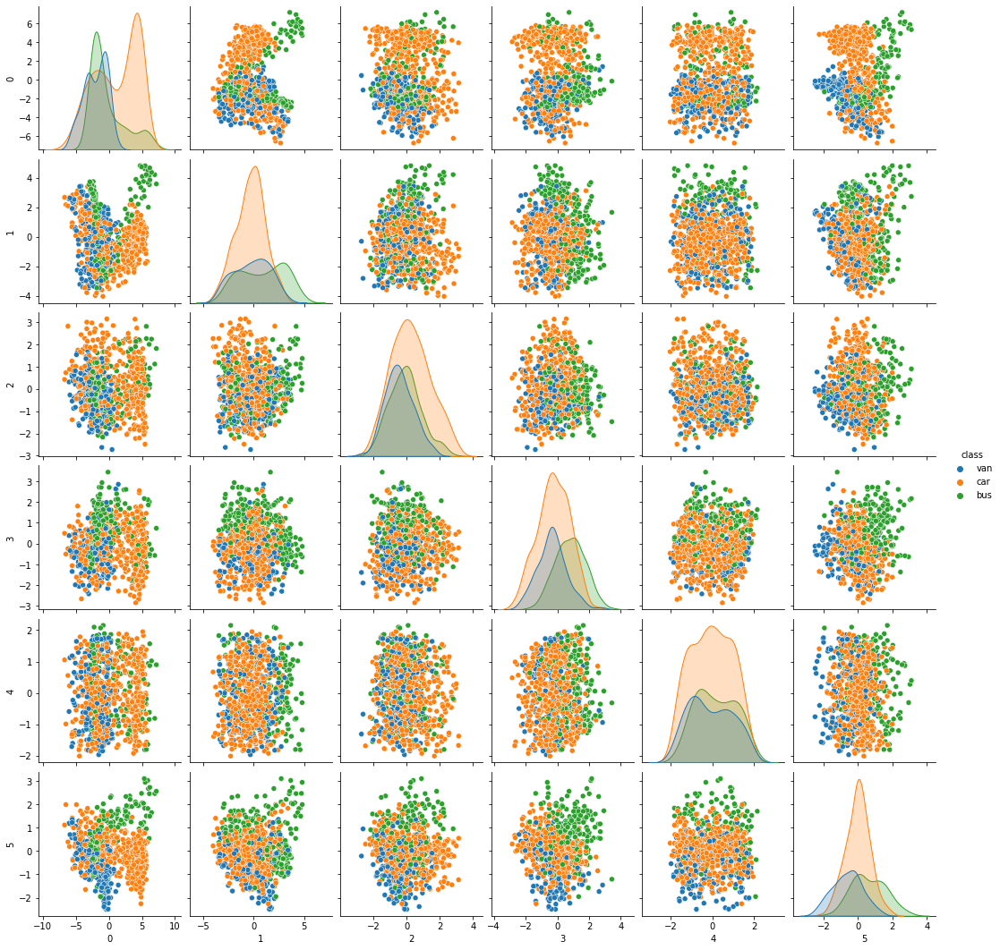

In [338]:
sns.pairplot(pca_df,hue="class")

# as seem below, th correlation does not exist in the pca components, and thisis desireable for the ML algorithm

In [339]:
# splitting features and target for svc and then scaling them

X = pca_df.drop('class',axis=1)
y = pca_df['class']

In [340]:
# train test split, we will keep 30% of data for test

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [341]:
scaler = StandardScaler()

In [342]:
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)

In [343]:
from sklearn.svm import SVC

In [344]:
# we will create a instance of svc with class weight balanced, and use grid search to find the best parameters

svc = SVC(class_weight='balanced')

In [345]:
from sklearn.model_selection import GridSearchCV

In [346]:
# creating different paramters for grid search

param_grid = {'C':[0.001,0.01,0.1,0.5,1],'gamma':['scale','auto']}
grid = GridSearchCV(svc,param_grid)

In [347]:
grid.fit(scaled_X_train,y_train)

GridSearchCV(estimator=SVC(class_weight='balanced'),
             param_grid={'C': [0.001, 0.01, 0.1, 0.5, 1],
                         'gamma': ['scale', 'auto']})

In [348]:
print(f"The best parameters found by grid search are: {grid.best_params_}")

The best parameters found by grid search are: {'C': 1, 'gamma': 'auto'}


In [349]:
grid_pred = grid.predict(scaled_X_test)

In [350]:
# we will not generate the confusion matrix and classification report, that will allow us to view the performance of the model

from sklearn.metrics import confusion_matrix,classification_report

In [351]:
confusion_matrix(y_test,grid_pred)

array([[ 66,   1,   2],
       [  7, 100,  13],
       [  4,   3,  56]])

In [352]:
print(classification_report(y_test,grid_pred))

# the accuracy score with 6 pca componenets is 88%. Considering that we have reduced that dimensions from 19 to 6, the accuracy score is quite impressive

              precision    recall  f1-score   support

         bus       0.86      0.96      0.90        69
         car       0.96      0.83      0.89       120
         van       0.79      0.89      0.84        63

    accuracy                           0.88       252
   macro avg       0.87      0.89      0.88       252
weighted avg       0.89      0.88      0.88       252



6. Conclusion: Showcase key pointer on how dimensional reduction helped in this case.

In [353]:
# Considering that the number of the dimensions have reduced from 19 to 6, and still the accuracy score is around 88%. 
# This will allow us to make more accurate predictions as the number of the features have come down and consequentially the amount of noise has reduced.